In [2]:
using Random
using Statistics
using DelimitedFiles
using Plots
using LaTeXStrings
using FFTW
using Polynomials
using DSP

In what is to follow, i have left some comments but many of the comments are wrong/outdated. so lol

In [2]:
#Generate Percolation
function generate_percolation(n:: Int64, site_p:: Float64):: Matrix{Bool}
    return [rand()< site_p for _ in 1:n, _ in 1:n] 
end

generate_percolation (generic function with 1 method)

In [3]:
# Functions for traversing the percolation and generating a realization of the random walk
function periodic_from_pos(n::Int64, pos::Vector{Int64})::Vector{Int64}
    pos_mod = (pos.- 1) .% n .+ 1
    if pos_mod[1] <= 0
        pos_mod[1] += n
    end
    if pos_mod[2] <= 0
        pos_mod[2] += n
    end
    return pos_mod
end

function step_on_perc_old(pos::Vector{Int64}, percolation:: Matrix{Bool}, n:: Int64):: Vector{Int64}
    delt = rand(-1:1, 2)
    npos = pos .+ delt

    per_pos = periodic_from_pos(n, npos)
    
    if percolation[per_pos[1], per_pos[2]] == true
        return npos
    else
        return pos
    end
end

function step_on_perc(pos::Vector{Int64}, percolation:: Matrix{Bool}, n:: Int64):: Vector{Int64}
    jumps =[[1,0],[0,1],[-1,0],[0,-1]]
    
    delt = jumps[rand(1:4)]
    npos = pos .+ delt

    per_pos = periodic_from_pos(n, npos)
    
    if percolation[per_pos[1], per_pos[2]] == true
        return npos
    else
        return pos
    end
end

function random_walk_on_perc(n::Int64, p_site::Float64, steps::Int64)
    perc = generate_percolation(n, p_site)
    init = [0,0]
    rw = zeros(Int64, (steps, 2))
    rw[1,:] = init

    for i in 2:steps
        rw[i,:] = step_on_perc(rw[i-1,:], perc, n)
    end  
    return rw  
end

function random_walk_on_perc_thresh(n::Int64, p_site::Float64, steps::Int64, thresh::Float64, delta ::Int64)
    rw = zeros(Int64, (steps, 2))
    temp_msd = 0

    while temp_msd < thresh
        perc = generate_percolation(n, p_site)
        init = [0,0]
        rw = zeros(Int64, (steps, 2))
        rw[1,:] = init

        for i in 2:steps
            rw[i,:] = step_on_perc(rw[i-1,:], perc, n)
        end  

        temp_msd = sum((rw[:,1][1+delta:steps]-rw[:,1][1:steps-delta]).^2)/(steps-delta) 
    end
    return rw 
end

# this function can be used to more easily compute MSD
function random_walk_on_perc_w_snorm(n::Int64, p_site::Float64, steps::Int64)
    perc = generate_percolation(n, p_site)
    init = [0,0]
    rw = zeros(Int64, (steps, 2))
    normrw = zeros(Int64, (steps))
    rw[1,:] = init

    for i in 2:steps
        rw[i,:] = step_on_perc(rw[i-1,:], perc, n)
        normrw[i] = rw[i,1]^2+rw[i,2]^2
    end  
    return normrw
end

random_walk_on_perc_w_snorm (generic function with 1 method)

Now lets generate a realization of a walk on a fractal at criticality and compute its temporal MSD

22.205108937305468

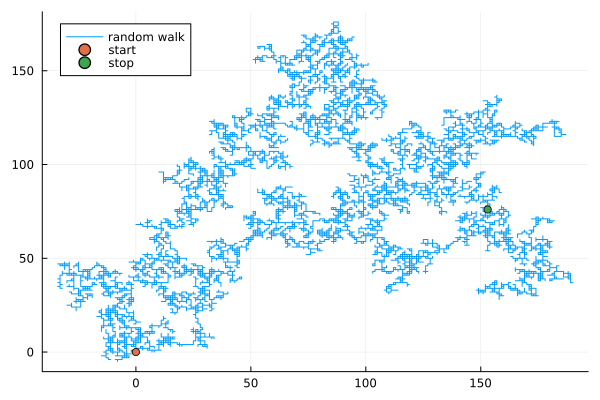

In [30]:
# generates a random walk on a random percolation near criticality
n = 10000
site_p = .6 # criticality .593 
step_num = 450000

rw_fractal = random_walk_on_perc(n, site_p, step_num)

plot(rw_fractal[:,1], rw_fractal[:,2], label="random walk")
plot!([0],[0], seriestype=:scatter, label="start")
delta = 200
print(sum((rw_fractal[:,1][1+delta:step_num]-rw_fractal[:,1][1:step_num-delta]).^2)/(step_num-delta))
plot!([rw_fractal[step_num, 1]],[rw_fractal[step_num,2]], seriestype=:scatter, label="stop")


To generate our data we only want realizations which have temporal MSD > 5. We want to exclude the realizations that are not on the infinite cluster. But this thresh cant be to high as we may exclude percolations with bottlnecks.

In [86]:
# This is used to generate files containing random realizations of random walks on percolation
# Thres needs to be low, in order for the bottle neck case to still exist.
n = 1000
steps = 4500
runs = 7000
delta = 200
site_prob = .6

function realize(walk)
    walk = random_walk_on_perc_thresh(n, site_prob, steps, 5.0, delta)
end

runs = zeros(runs,steps,2)
runs = map(realize, eachslice(runs, dims=1))

fx(arr) = permutedims(arr[:,1])
fy(arr) = permutedims(arr[:,2])

mapreduce(fx, vcat, runs)

open("fracwalks_xaxis_thresh5.txt", "w") do io
    writedlm(io, mapreduce(fx, vcat, runs))
end
open("fracwalks_yaxis_thresh5.txt", "w") do io
    writedlm(io, mapreduce(fy, vcat, runs))
end

# Fractional Brownian Motion

Now we will look a realization of FBM with $H=.4$.

This is more of a proof of concept. See below for comparison to walks on fractals.

### Results for $H=.4$
- $\alpha = .806$ which is very close to theoretical of $.8$
- PSD exponent $1.85$ which is close to the theoretical of $1.8$ but somewhat off. Is this a problem? I don't know, probably not

In [5]:
# First load in walk data originally generated in matlab
steps = 5000
runsx = readdlm("fbmwalks_xaxis.txt", ',', Float64, '\n')
runsy = readdlm("fbmwalks_yaxis.txt", ',', Float64, '\n')

6000×5000 Matrix{Float64}:
 0.0   0.195883    0.425359   …  -0.539577    -0.622441  -0.477541
 0.0  -0.0881071  -0.0210304      0.141777     0.178461   0.212707
 0.0   0.136515    0.0618517     -5.67974     -5.80501   -5.78253
 0.0  -0.129192   -0.151104      -2.67252     -2.80995   -2.92726
 0.0   0.105086    0.217008      -1.11668     -1.05373   -1.165
 0.0   0.173513    0.161487   …  -4.84904     -4.86109   -4.86175
 0.0   0.313       0.34825       -7.26546     -7.0681    -6.76487
 0.0  -0.0954867   0.0809857      6.87545      6.80784    6.81269
 0.0   0.156255   -0.102486      -4.52837     -4.53713   -4.75553
 0.0   0.49954     0.442251      -2.64474     -2.76166   -2.87656
 ⋮                            ⋱                          
 0.0   0.175216   -0.0736671      6.12359      6.07033    6.13578
 0.0  -0.0625268  -0.398764      -9.80594    -10.0113    -9.92802
 0.0   0.064293   -0.156783       1.24498      1.53032    1.79828
 0.0   0.0438099  -0.0499708     -5.46296     -5.1739    

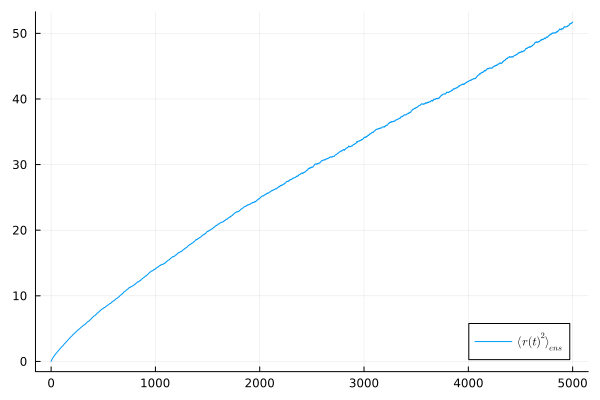

In [6]:
# computes ensemble MSD
ens_msd = map(mean, eachslice(runsx.^2+runsy.^2, dims=2))

plot(0:(steps-1), ens_msd, label=L"\langle r(t)^2\rangle_{ens}")

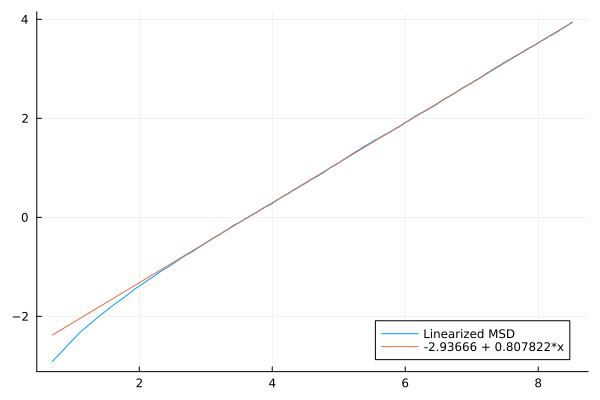

In [7]:
# Generates log of MSD to get exponent.
log_ens_msd = log.(ens_msd[2:steps])
logxs = log.(2:(steps))
best_fit = fit(logxs, log_ens_msd, 1)
plot(logxs, log_ens_msd, label="Linearized MSD")
plot!(logxs, best_fit.(logxs), label=best_fit)

1.00874548647255

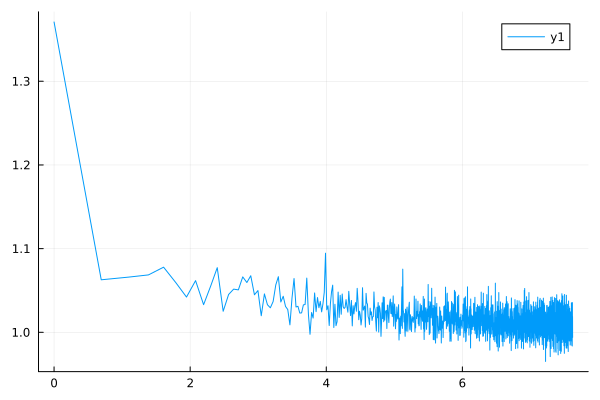

In [8]:
# Compute ens PSD from walk data
steps = 4096
offset = 1
runs = 6000

# these two functions give the same results
# spec = (abs2.(bfft(runsx, 2))+abs2.(bfft(runsy, 2)))./steps
#spec = (abs2.(ifft(runsx[:,1:4096], 2))+abs2.(ifft(runsy[:,1:4096], 2))).*steps
function fspec(s)
    periodogram(s).power
end

spec = map(fspec, eachslice(runsx[:,offset+1:steps-offset], dims=1))

freqs = periodogram(runsx[1,offset+1:steps-offset]).freq

fx(arr) = permutedims(arr[:,1])

# mapreduce(fx, vcat, spec)

#this is crazy slow. Now sure why
spec_mat = mapreduce(fx, vcat, spec)
ens_spec = map(mean, eachslice(spec_mat, dims=2))
ens_spec_std = map(std, eachslice(spec_mat, dims=2))

the_thing = ens_spec_std[1:length(ens_spec)-10]./ens_spec[1:length(ens_spec)-10]

print(mean(the_thing[length(the_thing)-100:length(the_thing)]))
plot(log.([i for i in 1:length(the_thing)]),the_thing)

In [9]:
freqs[2:length(freqs)].*(2*pi)

findfirst(freqs[2:length(freqs)].*(2*pi) .>= 1)

652

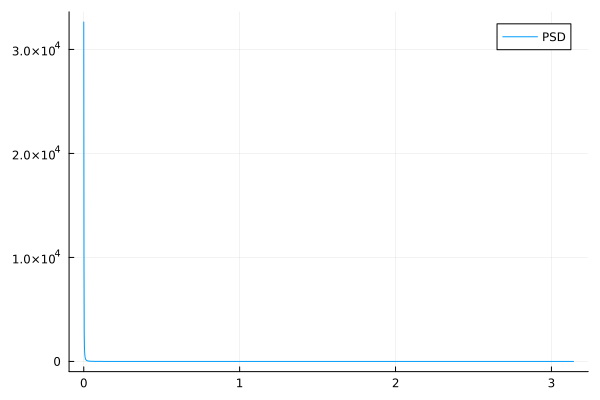

In [10]:
# plot PSD
freq = freqs.*(2*pi)
ens_psd = ens_spec


plot(freq, ens_psd, label="PSD")

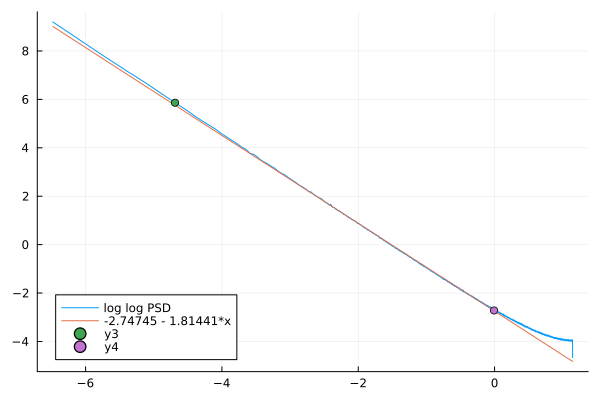

In [11]:
# Plot log log PSD

steps_for_line = findfirst(freqs[2:length(freqs)].*(2*pi) .>= 1)
offset = 5

freq = freqs[2:length(freqs)].*(2*pi)
ens_psd = ens_spec[2:length(ens_spec)]

best_fit = fit(log.(freq[offset+1:steps_for_line-offset]), log.(ens_psd[offset+1:steps_for_line-offset]), 1)

plot(log.(freq), log.(ens_psd), label="log log PSD")

plot!(log.(freq), best_fit.(log.(freq)), label=best_fit)

plot!([log(freq[offset+1])],[log(ens_psd[offset+1])], seriestype=:scatter)
plot!([log(freq[steps_for_line-offset])],[log(ens_psd[steps_for_line-offset])], seriestype=:scatter)

# theoretical is beta=2*.4+1= 1.8. meaning slope should be -1.8
# IM going to conclude that this meets theoretical results
# at the end of the day theoretical doesnt matter too much

# Random walk on percolation structure
these walks are realizations of percolation structures with $p=.6$, which is near criticality. We also require that teh temporal MSD of any realization is > 20, to ensure(at least to a higher probability) that we are on the infinite structure.

### Results
- MSD has $\alpha=0.6989$ and $d_w=2.8616$ which is very close to theoretical of $2.878$
- PSD exponent is $1.78$

Now this leads us to believe this is in general different then FBM.

In [102]:
# Load walk data
steps = 4500
runsxf = readdlm("fracwalks_xaxis_thresh5.txt", '\t', Int, '\n')
runsyf = readdlm("fracwalks_yaxis_thresh5.txt", '\t', Int, '\n')

7000×4500 Matrix{Int64}:
 0   1   1   1   2   2   2   3   3   3  …   11   11   12   12   12   13   14
 0   0   0   0   0   0   0   0   0   0      -8   -8   -7   -7   -7   -7   -7
 0  -1   0   0   0  -1  -1  -1  -1  -1     -22  -22  -22  -23  -23  -24  -23
 0   0   0   0   0   0   0   0   0   0       4    4    4    4    4    3    3
 0   0   0   1   1   1   1   1   1   1       9    9   10   10   10   10    9
 0  -1   0   0   0  -1  -1  -1   0   0  …    0    0   -1   -1   -1   -1   -1
 0   0   0   0   0   0  -1  -1  -1  -1     -26  -26  -27  -27  -27  -26  -26
 0   0   0   0   0  -1  -1  -1   0   0      -1    0   -1   -2   -2   -2   -2
 0   1   1   0   1   1   1   1   0   0     -16  -16  -16  -16  -16  -16  -16
 0  -1  -1  -1  -1  -1  -2  -3  -3  -4     -23  -22  -22  -21  -21  -21  -21
 ⋮                   ⋮                  ⋱              ⋮                 
 0   0   0   0   0   0   0  -1   0   0     -22  -23  -23  -23  -24  -24  -25
 0   0   0  -1  -1  -1  -1  -2  -2  -2      -4   -4   

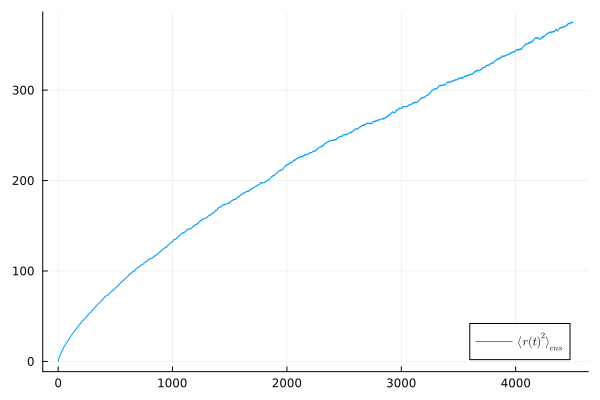

In [103]:
# create MSD
steps = 4500
ens_msdf = map(mean, eachslice(runsxf.^2+runsyf.^2, dims=2))

plot(0:(steps-1), ens_msdf, label=L"\langle r(t)^2\rangle_{ens}")

In [128]:
# Log of MSD
steps = 4500
log_ens_msdf = log.(ens_msdf[2:steps])
logxsf = log.(2:(steps))
best_fitf = fit(logxsf, log_ens_msdf, 1)
#plot(logxsf, log_ens_msdf, label="log-log linearization of MSD")
plot(2:(steps), ens_msdf[2:steps], label=L"\langle r(t)^2\rangle_{ens}", xaxis=:log, yaxis=:log, legendfontsize=12)

plot!(2:(steps), exp.(best_fitf.(logxsf)), label=string("Best Fit: ", L"\sim t^{%$(round(coeffs(best_fitf)[2],digits=4))}"), xaxis=:log, yaxis=:log)
xlabel!("Number of steps (t)")

savefig("lin_ens_msd_frac.pdf")

"c:\\Users\\jorqu\\OneDrive - Colostate\\Documents\\random walks\\lin_ens_msd_frac.pdf"

In [105]:
# COmpute theoretical results for dw
# we should expect the t^2/dw
dw = 2/coeffs(best_fitf)[2]
# theoretical says 2.878

2.8301037071583406

1.0173908960647386

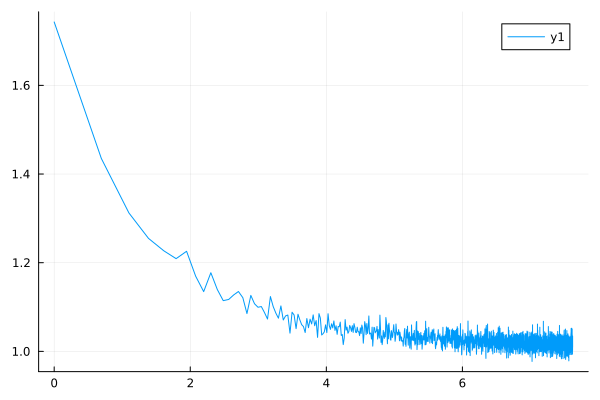

In [106]:
# Compute ens PSD from walk data
steps = 4096
offset = 1

# these two functions give the same results
# spec = (abs2.(bfft(runsx, 2))+abs2.(bfft(runsy, 2)))./steps
#spec = (abs2.(ifft(runsx[:,1:4096], 2))+abs2.(ifft(runsy[:,1:4096], 2))).*steps
fspec(s) = periodogram(s).power
fx(arr) = permutedims(arr[:,1])

specf = map(fspec, eachslice(runsxf[:,offset+1:steps-offset], dims=1))

freqsf = periodogram(runsxf[1,offset+1:steps-offset]).freq

# mapreduce(fx, vcat, spec)

#this is crazy slow. Now sure why
spec_matf = mapreduce(fx, vcat, specf)
ens_specf = map(mean, eachslice(spec_matf, dims=2))
ens_spec_stdf = map(std, eachslice(spec_matf, dims=2))

the_thingf = ens_spec_stdf[1:length(ens_specf)-10]./ens_specf[1:length(ens_specf)-10]

print(mean(the_thingf[length(the_thingf)-100:length(the_thingf)]))
plot(log.([i for i in 1:length(the_thingf)]),the_thingf)

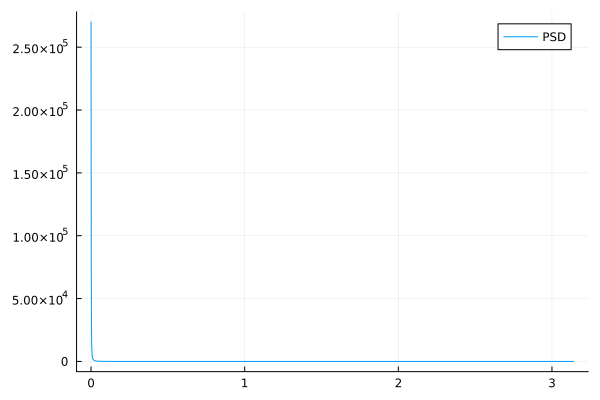

In [107]:
# plot PSD
freqf = freqsf.*(2*pi)
ens_psdf = ens_specf


plot(freqf, ens_psdf, label="PSD")

In [129]:
# Plot log log PSD

steps_for_line = findfirst(freqsf[2:length(freqsf)].*(2*pi) .>= 1)
offset = 5

freqf = freqsf[2:length(freqsf)-10].*(2*pi)
ens_psdf = ens_specf[2:length(ens_specf)-10]

best_fitf = fit(log.(freqf[offset:steps_for_line-offset]), log.(ens_psdf[offset:steps_for_line-offset]), 1)

#plot(log.(freqf), log.(ens_psdf), label="log log PSD")

#plot!(log.(freqf), best_fitf.(log.(freqf)), label=best_fitf)


plot(freqf, ens_psdf, label="Ensemble PSD", xaxis=:log, yaxis=:log, legendfontsize=12)

plot!(freqf, exp.(best_fitf.(log.(freqf))), label=string("Best Fit: ", L"\sim t^{%$(round(coeffs(best_fitf)[2],digits=4))}"), xaxis=:log, yaxis=:log)

xlabel!("Frequence (f)")

savefig("lin_ens_psd_frac.pdf")

"c:\\Users\\jorqu\\OneDrive - Colostate\\Documents\\random walks\\lin_ens_psd_frac.pdf"

# FBM to mimic walk of fractal
Ok so now we want to construct a FBM walk realization that mimics to the surface level appearance of the fractal walk. Meaning we want to have the same msd
for the fractal walk we have $\alpha = .6989$ meaning for FBM to have the same we need $H=.3494$

In [3]:
# First load in walk data originally generated in matlab
runsx = readdlm("fbmwalks_xaxis_alph_6989.txt", ',', Float64, '\n')
runsy = readdlm("fbmwalks_yaxis_alph_6989.txt", ',', Float64, '\n')

6000×5000 Matrix{Float64}:
 0.0  -0.135372   -0.175291    -0.073951   …   -0.502759    -0.856201
 0.0  -0.297443   -0.373611    -0.550008        5.09503      5.21021
 0.0   0.0127295   0.0775191    0.0613507       1.65051      1.69486
 0.0  -0.217394   -0.167387    -0.196221        0.0495847   -0.0175376
 0.0  -0.14054    -0.172076     0.151102        0.804677     0.935903
 0.0  -0.15715     0.0177014   -0.722737   …   -6.3385      -6.62195
 0.0   0.0315814   0.526658     0.0991906       3.2258       3.44543
 0.0  -0.0645694  -0.0916056   -0.334416        3.98053      4.15756
 0.0   0.0652254  -0.0405817   -0.29719       -10.6045     -11.0825
 0.0  -0.399221   -0.114064    -0.0485594       2.50139      1.96832
 ⋮                                         ⋱               
 0.0  -0.0845781   0.00226632  -0.105459        1.3328       1.36298
 0.0  -0.0760394  -0.252476    -0.545185        1.89769      1.86834
 0.0   0.171434   -0.11536     -0.0207534      -2.28067     -2.04054
 0.0   0.0779

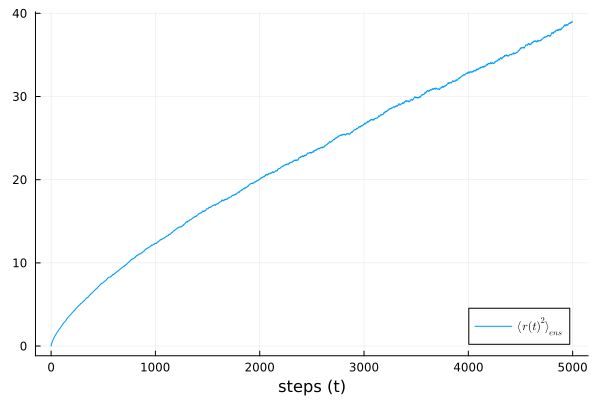

In [4]:
# computes ensemble MSD
steps=5000
ens_msd = map(mean, eachslice(runsx.^2+runsy.^2, dims=2))

plot(0:(steps-1), ens_msd, label=L"\langle r(t)^2\rangle_{ens}")
xlabel!("steps (t)")

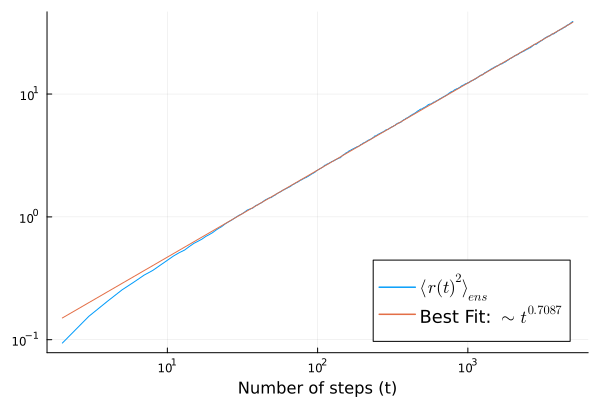

In [135]:
# Generates log of MSD to get exponent.
steps = 5000
log_ens_msd = log.(ens_msd[2:steps])
logxs = log.(2:(steps))
best_fit = fit(logxs, log_ens_msd, 1)
#plot(logxs, log_ens_msd, label="Linearized MSD")
#plot!(logxs, best_fit.(logxs), label=best_fit)

plot(2:(steps), ens_msd[2:steps], label=L"\langle r(t)^2\rangle_{ens}", xaxis=:log, yaxis=:log, legendfontsize=12)

plot!(2:(steps), exp.(best_fit.(logxs)), label=string("Best Fit: ", L"\sim t^{%$(round(coeffs(best_fit)[2],digits=4))}"), xaxis=:log, yaxis=:log)
xlabel!("Number of steps (t)")

#savefig("lin_ens_msd_fbm.pdf")

1.0044813326546411

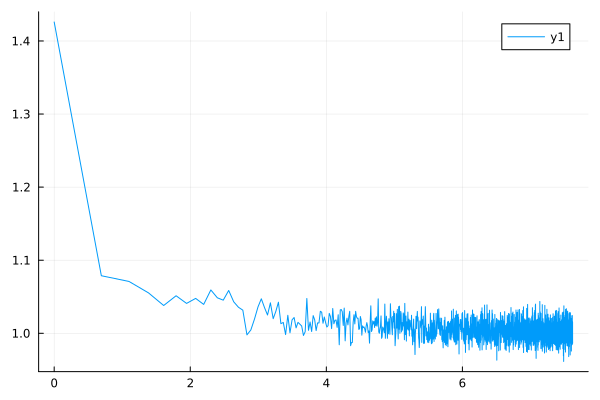

In [131]:
# Compute ens PSD from walk data
steps = 4096
runs = 6000
offset = 1

# these two functions give the same results
# spec = (abs2.(bfft(runsx, 2))+abs2.(bfft(runsy, 2)))./steps
#spec = (abs2.(ifft(runsx[:,1:4096], 2))+abs2.(ifft(runsy[:,1:4096], 2))).*steps
function fspec(s)
    periodogram(s).power
end

spec = map(fspec, eachslice(runsx[:,offset+1:steps-offset], dims=1))

freqs = periodogram(runsx[1,offset+1:steps-offset]).freq

fx(arr) = permutedims(arr[:,1])

# mapreduce(fx, vcat, spec)

#this is crazy slow. Now sure why
spec_mat = mapreduce(fx, vcat, spec)
ens_spec = map(mean, eachslice(spec_mat, dims=2))
ens_spec_std = map(std, eachslice(spec_mat, dims=2))

the_thing = ens_spec_std[1:length(ens_spec)-10]./ens_spec[1:length(ens_spec)-10]

print(mean(the_thing))
plot(log.([i for i in 1:length(the_thing)]),the_thing)

the coefficient of variation is $\gamma=\sigma/\mu$ as $\omega\rightarrow\infty$ where $\omega=fT$

For $H=.4$ we found the thing to be $1.0017538399161883$

and for $H=.35$ we found the thing to be $1.0044813326546411$

For fractals We get $1.0173908$

My conclusion is that the coefficient of variance is not affected by FBM vs random walk on fractal (This suggest that the coeff of variance may just tell us about sub and super anomalous behavior)

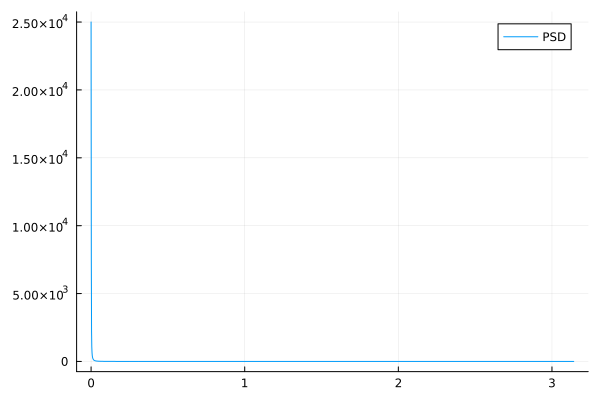

In [113]:
# plot PSD
freq = freqs.*(2*pi)
ens_psd = ens_spec


plot(freq, ens_psd, label="PSD")

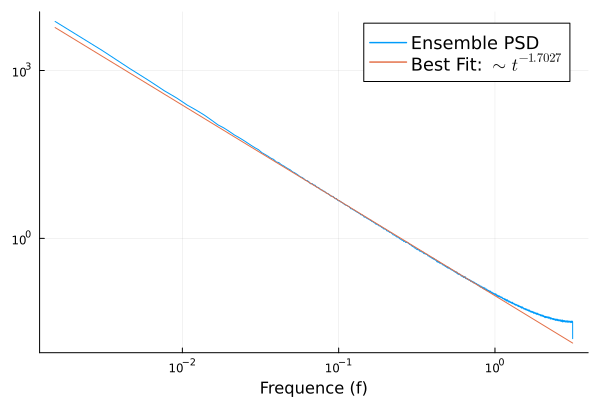

In [134]:
# Plot log log PSD

steps_for_line = findfirst(freqs[2:length(freqs)].*(2*pi) .>= 1)
offset = 5

freq = freqs[2:length(freqs)].*(2*pi)
ens_psd = ens_spec[2:length(ens_spec)]

best_fit = fit(log.(freq[offset+1:steps_for_line-offset]), log.(ens_psd[offset+1:steps_for_line-offset]), 1)

#plot(log.(freq), log.(ens_psd), label="log log PSD")

#plot!(log.(freq), best_fit.(log.(freq)), label=best_fit)

plot(freq, ens_psd, label="Ensemble PSD", xaxis=:log, yaxis=:log, legendfontsize=12)

plot!(freq, exp.(best_fit.(log.(freq))), label=string("Best Fit: ", L"\sim t^{%$(round(coeffs(best_fit)[2],digits=4))}"), xaxis=:log, yaxis=:log)

xlabel!("Frequence (f)")

#savefig("lin_ens_psd_fbm.png")

#plot!([log(freq[offset+1])],[log(ens_psd[offset+1])], seriestype=:scatter)
#plot!([log(freq[steps_for_line-offset])],[log(ens_psd[steps_for_line-offset])], seriestype=:scatter)

# theoretical is beta=2*.3494+1= 1.6988. meaning slope should be -1.7 or maybe a little above
# at the end of the day theoretical doesnt matter too much, just the difference between this and the fractal walks